In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/load-model/attention_model_state_100.pth
/kaggle/input/flickr8kimagescaptions/flickr8k/captions.txt
/kaggle/input/flickr8kimagescaptions/flickr8k/images/3226254560_2f8ac147ea.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/214543992_ce6c0d9f9b.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/2366643786_9c9a830db8.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/3368819708_0bfa0808f8.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/2190227737_6e0bde2623.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/2752809449_632cd991b3.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/3097776588_312932e438.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/1206506157_c7956accd5.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/1319634306_816f21677f.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/2465218087_fca77998c6.jpg
/kaggle/input/flickr8kimagescaptions/flickr8k/images/3351493005_6e5030f596.jpg
/kaggle/input/flic

In [2]:
data_location="../input/flickr8kimagescaptions/flickr8k"

In [3]:
import pandas as pd
!ls

__notebook_source__.ipynb


In [4]:
df=pd.read_csv(data_location+"/captions.txt")

In [5]:
import os
print(os.listdir("../input/flickr8kimagescaptions/flickr8k"))

['captions.txt', 'images']


In [6]:
df.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [7]:
import os
from collections import Counter
import spacy
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

from PIL import Image

In [8]:
spacy_eng = spacy.load("en")

In [9]:
class Vocab:
    def __init__(self,threshold_freq):
        #setting the pre-reserved tokens int to string tokens
        self.itos = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}
        
        #string to int tokens
        #its reverse dict self.itos
        self.stoi = {v:k for k,v in self.itos.items()}
        
        self.freq_threshold = threshold_freq
        
    def __len__(self): return len(self.itos)
    
    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in spacy_eng.tokenizer(text)]
    
    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4
        
        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1
                
                #add the word to the vocab if it reaches minum frequecy threshold
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1
    
    def numericalize(self,text):
        tokenized_text = self.tokenize(text)
        return [ self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text ]

In [10]:
class flickrdataset(Dataset):
    def __init__(self,root_dir,captions_file,transform=None,frequency_threshold=5):
        self.root_dir=root_dir
        self.df=pd.read_csv(captions_file)
        self.transform=transform
        self.imgs=self.df["image"]
        self.captions=self.df["caption"]
        
        self.vocab = Vocab(frequency_threshold)
        self.vocab.build_vocab(self.captions.tolist())
    def __len__(self):
        return len(self.df)
    def __getitem__(self,idx):
        captions=self.captions[idx]
        images=self.imgs[idx]
        img=Image.open(self.root_dir+"/"+images).convert("RGB")
        if self.transform:
            img=self.transform(img)
        cap_vec=[]
        cap_vec+=[self.vocab.stoi["<SOS>"]]
        cap_vec+=self.vocab.numericalize(captions)
        cap_vec+=[self.vocab.stoi["<EOS>"]]
        return img,torch.tensor(cap_vec)

In [11]:
transforms=T.Compose([T.Resize(256),                     
    T.RandomCrop(224),                 
    T.ToTensor()                               
    #T.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
                     ]
                    )

In [12]:
import matplotlib.pyplot as plt
def show_image(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

In [13]:
dataset =  flickrdataset(
    root_dir = data_location+"/images",
    captions_file = data_location+"/captions.txt",
    transform=transforms
)

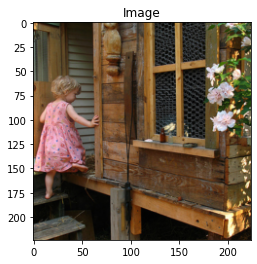

Token: tensor([  1,   4,  28,   8,   4, 195, 151,  17,  32,  67,   4, 353,  11, 711,
          8,  24,   3, 496,   5,   2])
Sentence:
['<SOS>', 'a', 'child', 'in', 'a', 'pink', 'dress', 'is', 'climbing', 'up', 'a', 'set', 'of', 'stairs', 'in', 'an', '<UNK>', 'way', '.', '<EOS>']


In [14]:
img,cap=dataset[0]
show_image(img,"Image")
print("Token:",cap)
print("Sentence:")
print([dataset.vocab.itos[token] for token in cap.tolist()])

In [15]:
BATCH_SIZE = 256
NUM_WORKER = 1

#token to represent the padding
pad_idx = dataset.vocab.stoi["<PAD>"]
from torch.utils.data.sampler import SubsetRandomSampler
def collate_function(batch):

    imgs = [item[0].unsqueeze(0) for item in batch]
    imgs = torch.cat(imgs,dim=0)
    targets = [item[1] for item in batch]
    targets = pad_sequence(targets, batch_first=True, padding_value=dataset.vocab.stoi["<PAD>"])
    return imgs,targets

validation_split = .2
shuffle_dataset = True
random_seed= 42

# Creating data indices for training and validation splits:
dataset_size = len(dataset)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers and loaders:
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

train_loader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, 
                                           sampler=train_sampler,num_workers=NUM_WORKER,collate_fn=collate_function)
validation_loader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE,
                                                sampler=valid_sampler,num_workers=NUM_WORKER,collate_fn=collate_function)


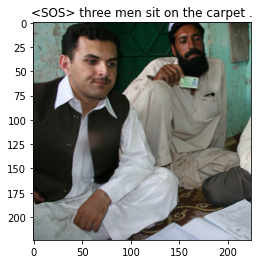

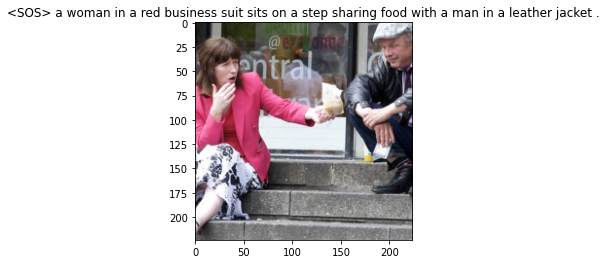

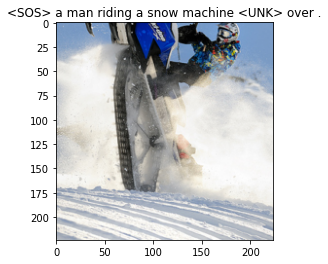

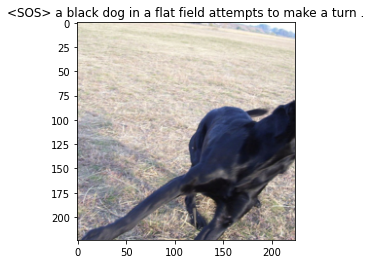

In [16]:
dataiter=next(iter(train_loader))
images, captions_ = dataiter
for k in range(4):
    img,captions=images[k],captions_[k]
    show_image(img," ".join([dataset.vocab.itos[token] for token in captions.tolist() if token!=dataset.vocab.stoi["<EOS>"]and token!=dataset.vocab.stoi["<PAD>"]]))
    plt.show()

In [17]:
import torch
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim

In [18]:
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN,self).__init__()
        resnet=models.resnet50(pretrained=True)
        for p in resnet.parameters():
            p.requires_grad_(False)
        modules=list(resnet.children())[:-2]
        self.resnet=nn.Sequential(*modules)
    def forward(self,images):
        features=self.resnet(images)
        features=features.permute(0,2,3,1)
        features=features.view(features.size(0),-1,features.size(-1))
        return features #(batch_size,49,2048)
        

In [19]:
class BahadnauAttention(nn.Module):
    def __init__(self):
        super(BahadnauAttention,self).__init__()
        self.U=nn.Linear(512,512)
        self.W=nn.Linear(2048,512)
        self.v=nn.Linear(512,1)
        self.tanh=nn.Tanh()
        self.softmax=nn.Softmax(1)
        
    def forward(self,features,hidden_states):
        U_hidden=self.U(hidden_states)#(batch_size,512)
        W_features=self.W(features)#(batch_size,49,512)
        attention=self.tanh(U_hidden.unsqueeze(1)+W_features)
        e=self.v(attention).squeeze(2) #(batch_size,1)
        alpha=self.softmax(e)
        context=(features*alpha.unsqueeze(2)).sum(1)
        return alpha,context

In [20]:
class DecoderRNN(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        
        #save the model param
        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim
        
        self.embedding = nn.Embedding(vocab_size,embed_size)
        self.attention = BahadnauAttention()
        
        
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  
        self.lstm_cell = nn.LSTMCell(embed_size+encoder_dim,decoder_dim,bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        
        
        self.fcn = nn.Linear(decoder_dim,vocab_size)
        self.drop = nn.Dropout(drop_prob)
        
        
    
    def forward(self, features, captions):
        
        #vectorize the caption
        embeds = self.embedding(captions)
        
        # Initialize LSTM state
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)
        
        #get the seq length to iterate
        seq_length = len(captions[0])-1 #Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)
        
        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,num_features).to(device)
                
        for s in range(seq_length):
            alpha,context = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, s], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
                    
            output = self.fcn(self.drop(h))
            
            preds[:,s] = output
            alphas[:,s] = alpha  
        
        
        return preds, alphas
    
    def generate_caption(self,features,max_len=20,vocab=None):
        # Inference part
        # Given the image features generate the captions
        
        batch_size = features.size(0)
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)
        
        alphas = []
        
        #starting input
        word = torch.tensor(vocab.stoi['<SOS>']).view(1,-1).to(device)
        embeds = self.embedding(word)

        
        captions = []
        
        for i in range(max_len):
            alpha,context = self.attention(features, h)
            
            
            #store the apla score
            alphas.append(alpha.cpu().detach().numpy())
            
            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))
            output = output.view(batch_size,-1)
        
            
            #select the word with most val
            predicted_word_idx = output.argmax(dim=1)
            
            #save the generated word
            captions.append(predicted_word_idx.item())
            
            #end if <EOS detected>
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            #send generated word as the next caption
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))
        
        #covert the vocab idx to words and return sentence
        return [vocab.itos[idx] for idx in captions],alphas
    
    
    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c

In [21]:
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        self.encoder = EncoderCNN()
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size = len(dataset.vocab),
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )
        
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

In [22]:
embed_size=300
vocab_size = len(dataset.vocab)
attention_dim=256
encoder_dim=2048
decoder_dim=512
learning_rate = 3e-4

In [23]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [24]:
model = EncoderDecoder(
    embed_size=300,
    vocab_size = len(dataset.vocab),
    attention_dim=256,
    encoder_dim=2048,
    decoder_dim=512
).to(device)
print(type(torch.load("../input/load-model/attention_model_state_100.pth")))
#model.load_state_dict(torch.load("../input/load-model/attention_model_state_100.pth")["state_dict"])
criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

<class 'dict'>


In [25]:
def save_model(model,num_epochs):
    model_state = {
        'num_epochs':num_epochs,
        'embed_size':embed_size,
        'vocab_size':len(dataset.vocab),
        'attention_dim':attention_dim,
        'encoder_dim':encoder_dim,
        'decoder_dim':decoder_dim,
        'state_dict':model.state_dict()
    }

    torch.save(model_state,'attention_model_state.pth')

Epoch: 1 loss: 4.18739


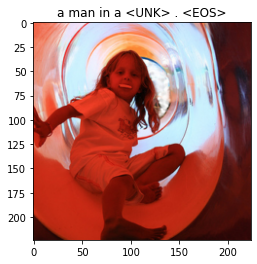

Epoch: 2 loss: 3.69235


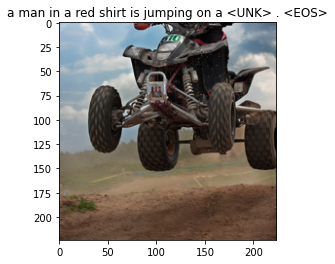

Epoch: 3 loss: 3.29822


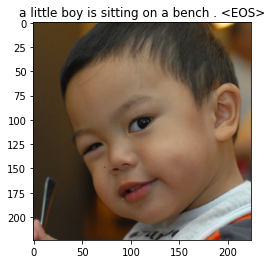

Epoch: 4 loss: 3.11192


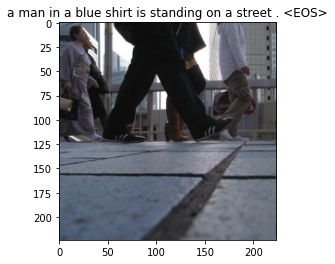

Epoch: 5 loss: 2.97211


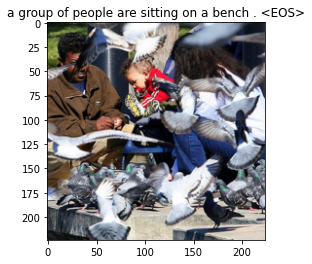

Epoch: 6 loss: 2.80363


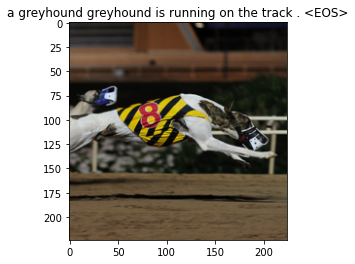

Epoch: 7 loss: 2.83822


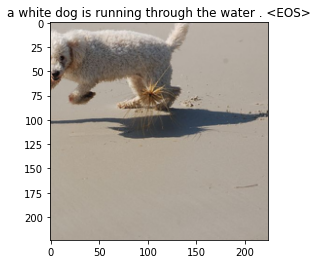

Epoch: 8 loss: 2.75251


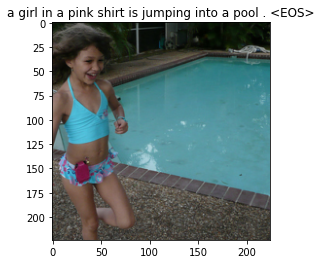

Epoch: 9 loss: 2.72959


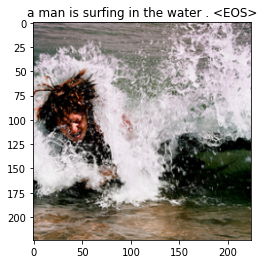

Epoch: 10 loss: 2.64040


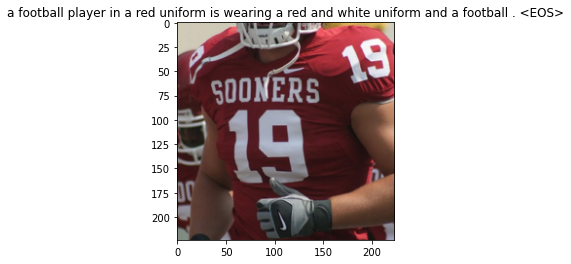

Epoch: 11 loss: 2.61250


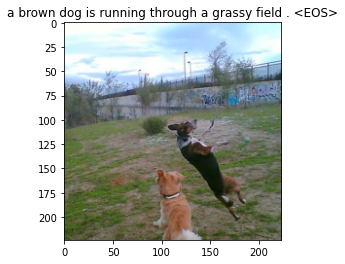

Epoch: 12 loss: 2.56848


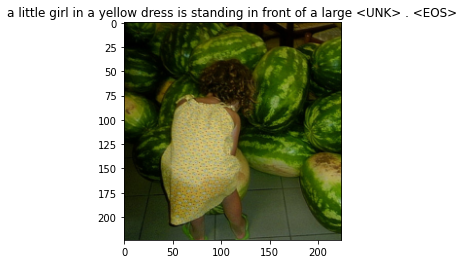

Epoch: 13 loss: 2.51232


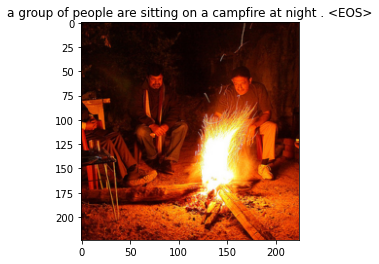

Epoch: 14 loss: 2.45321


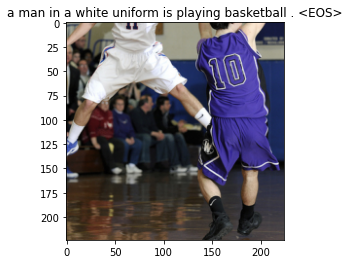

Epoch: 15 loss: 2.38963


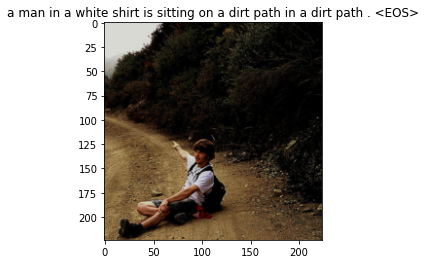

Epoch: 16 loss: 2.40369


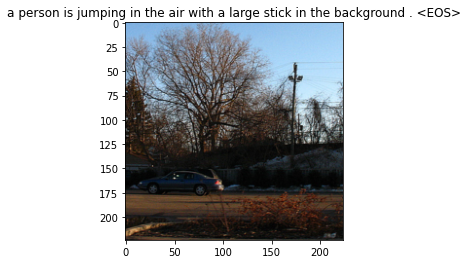

Epoch: 17 loss: 2.44247


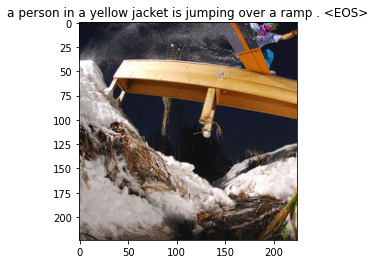

Epoch: 18 loss: 2.36357


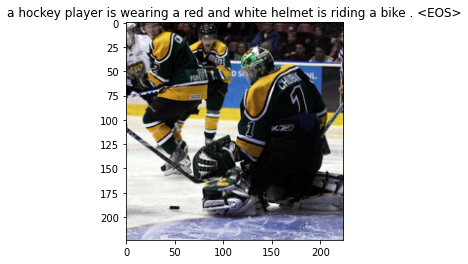

Epoch: 19 loss: 2.30606


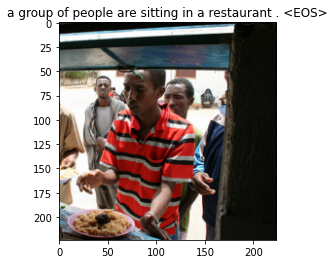

Epoch: 20 loss: 2.38662


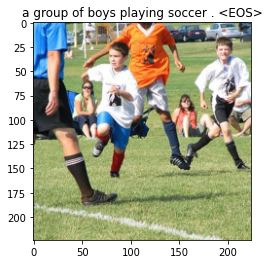

Epoch: 21 loss: 2.24491


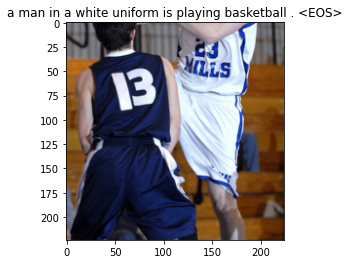

Epoch: 22 loss: 2.29866


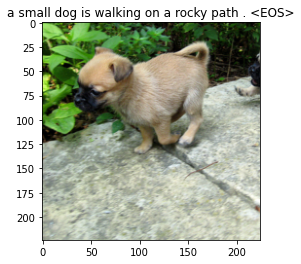

Epoch: 23 loss: 2.19088


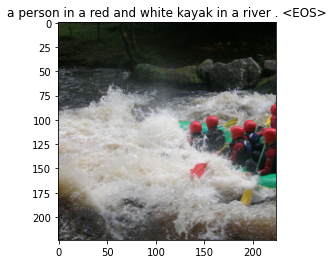

Epoch: 24 loss: 2.13583


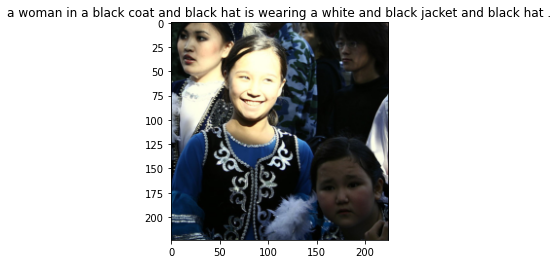

Epoch: 25 loss: 2.13739


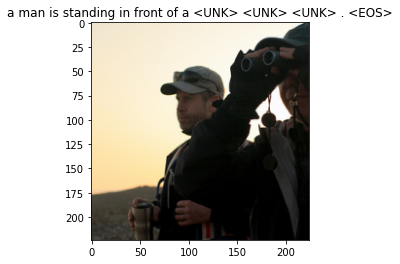

Epoch: 26 loss: 2.14729


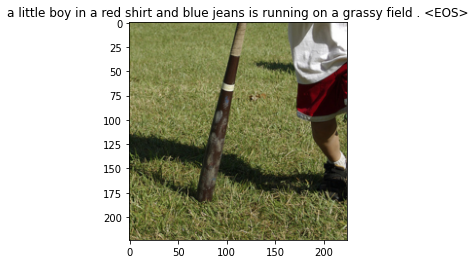

Epoch: 27 loss: 2.10050


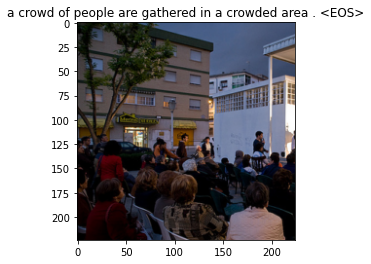

Epoch: 28 loss: 2.05397


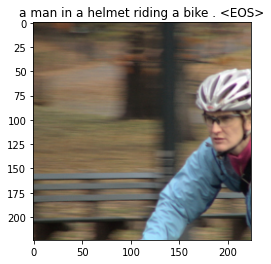

Epoch: 29 loss: 2.10893


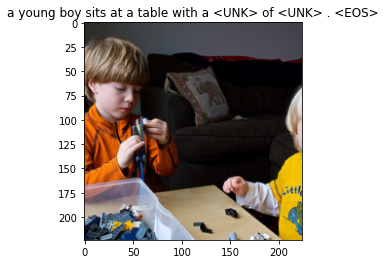

Epoch: 30 loss: 2.09932


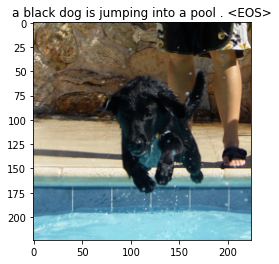

Epoch: 31 loss: 2.00414


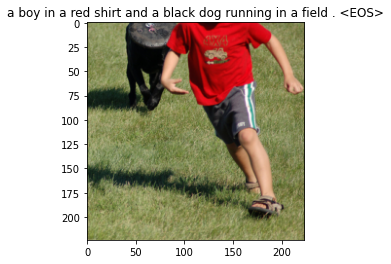

Epoch: 32 loss: 2.02302


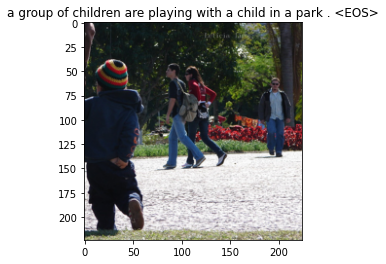

Epoch: 33 loss: 2.02040


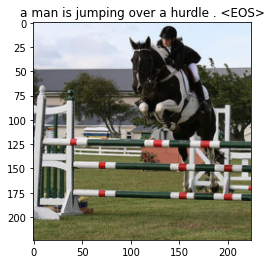

Epoch: 34 loss: 1.98415


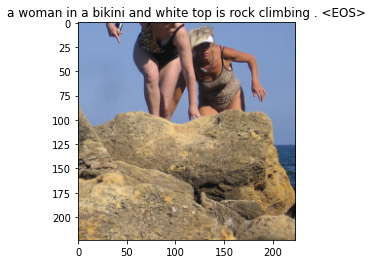

Epoch: 35 loss: 1.93864


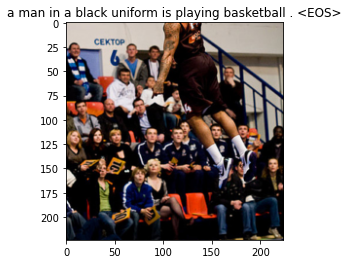

Epoch: 36 loss: 2.01005


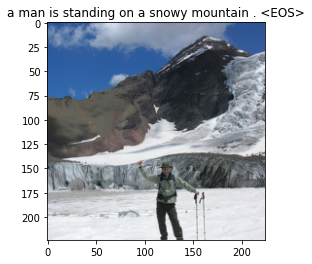

Epoch: 37 loss: 1.99073


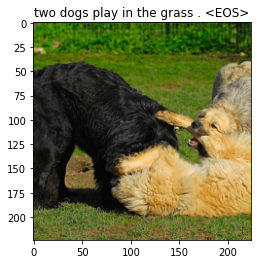

Epoch: 38 loss: 1.92432


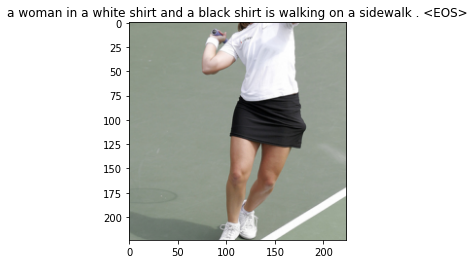

Epoch: 39 loss: 1.85839


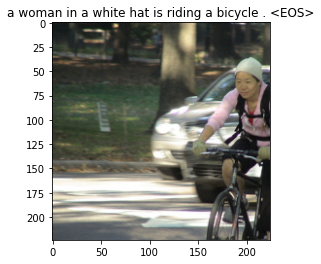

Epoch: 40 loss: 1.81478


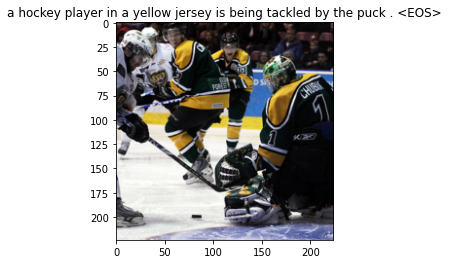

Epoch: 41 loss: 1.89624


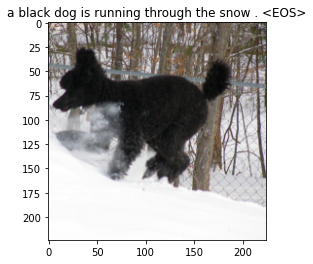

Epoch: 42 loss: 1.76192


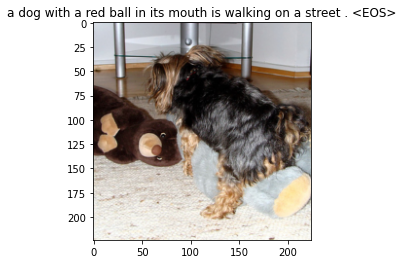

Epoch: 43 loss: 1.87703


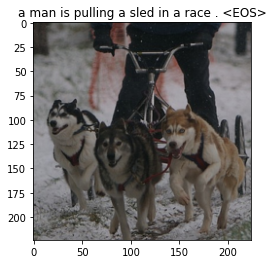

Epoch: 44 loss: 1.80463


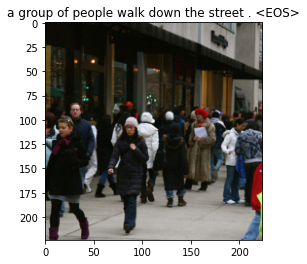

Epoch: 45 loss: 1.83567


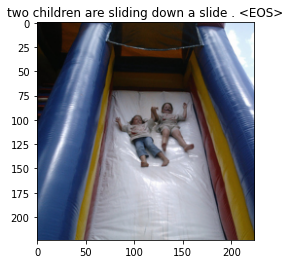

Epoch: 46 loss: 1.81713


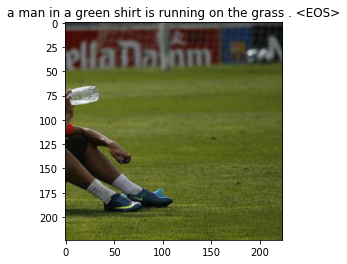

Epoch: 47 loss: 1.83499


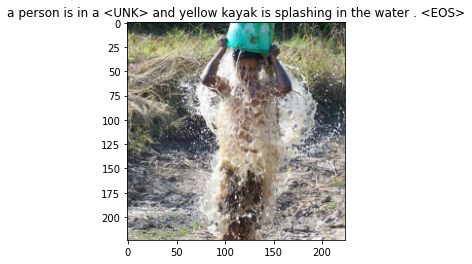

Epoch: 48 loss: 1.76337


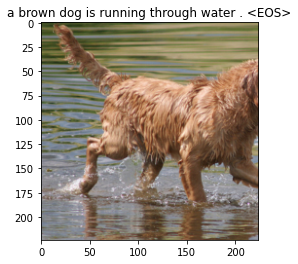

Epoch: 49 loss: 1.77193


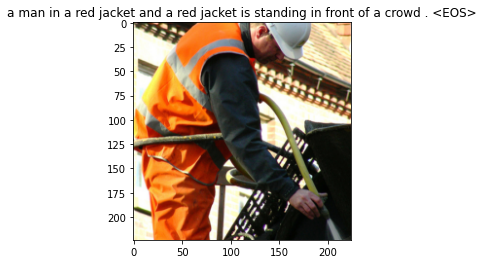

Epoch: 50 loss: 1.79623


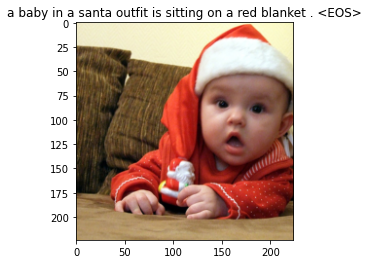

Epoch: 51 loss: 1.76726


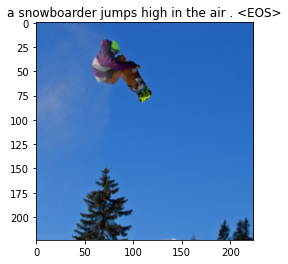

Epoch: 52 loss: 1.77369


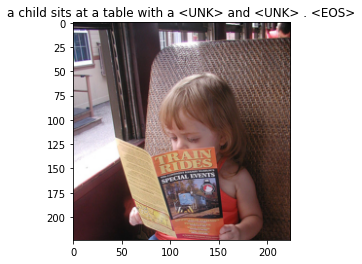

Epoch: 53 loss: 1.63885


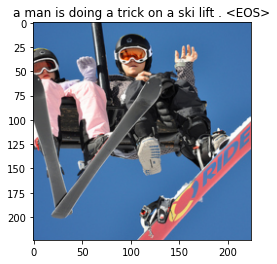

Epoch: 55 loss: 1.69190


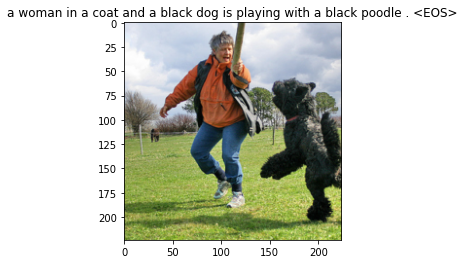

Epoch: 56 loss: 1.70831


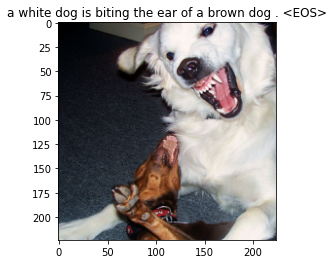

Epoch: 57 loss: 1.66580


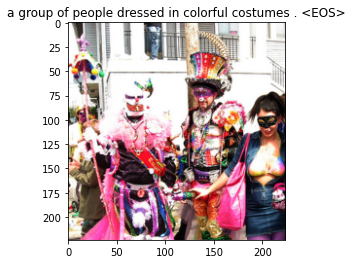

Epoch: 58 loss: 1.68036


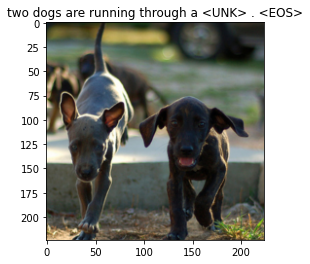

Epoch: 59 loss: 1.68965


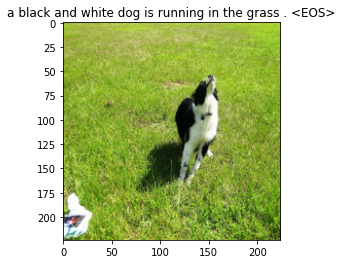

Epoch: 60 loss: 1.60925


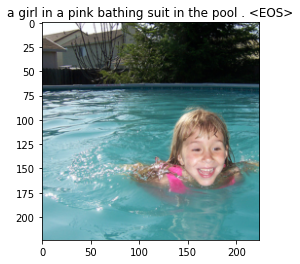

Epoch: 61 loss: 1.63419


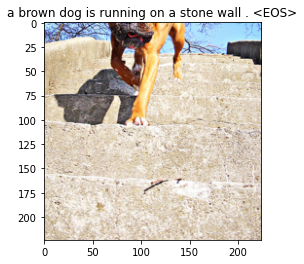

Epoch: 62 loss: 1.66358


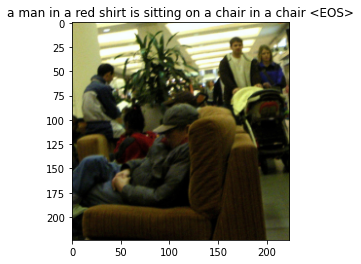

Epoch: 63 loss: 1.60642


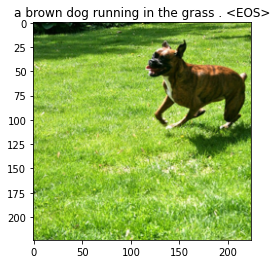

Epoch: 64 loss: 1.57441


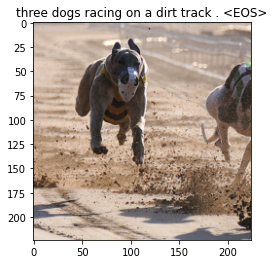

Epoch: 65 loss: 1.58493


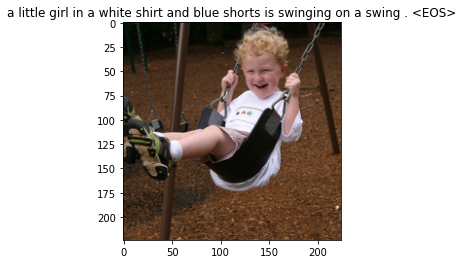

Epoch: 66 loss: 1.58003


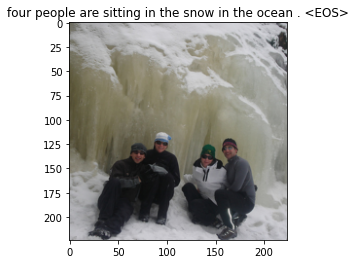

Epoch: 67 loss: 1.58435


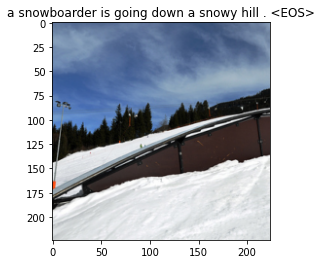

Epoch: 68 loss: 1.52167


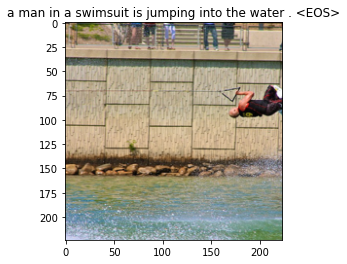

Epoch: 69 loss: 1.56458


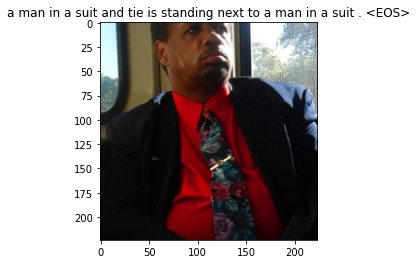

Epoch: 70 loss: 1.51264


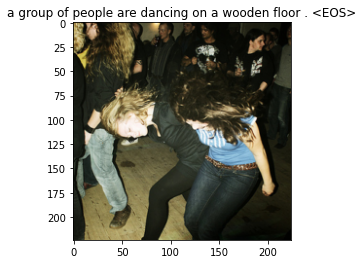

Epoch: 71 loss: 1.52212


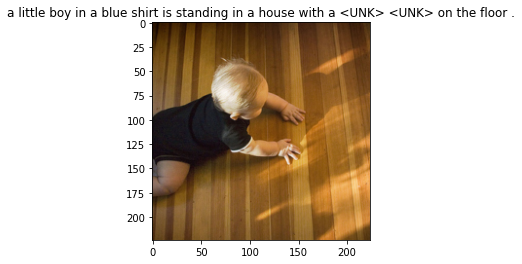

Epoch: 72 loss: 1.50224


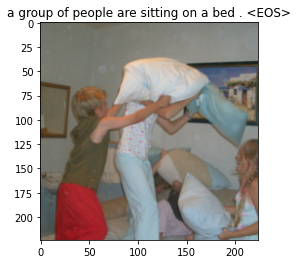

Epoch: 73 loss: 1.37985


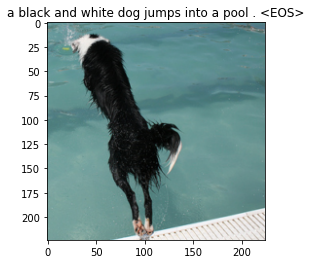

Epoch: 74 loss: 1.52435


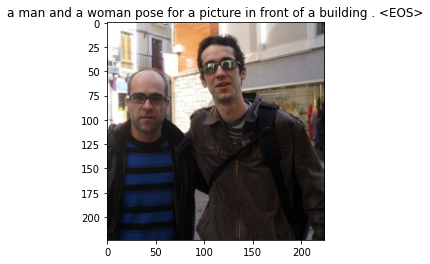

Epoch: 75 loss: 1.53717


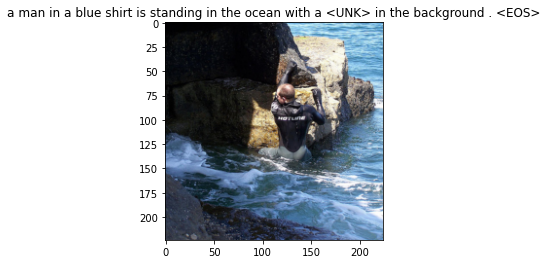

Epoch: 76 loss: 1.45439


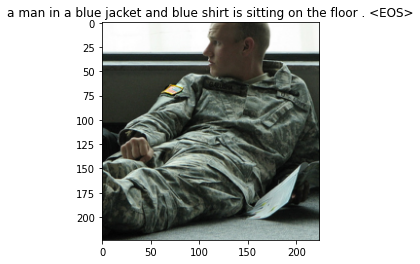

Epoch: 77 loss: 1.46666


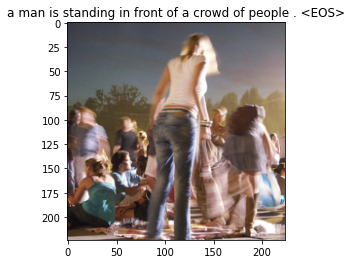

Epoch: 78 loss: 1.49249


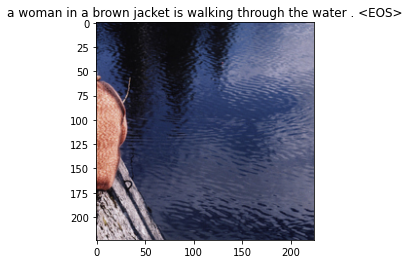

Epoch: 79 loss: 1.44839


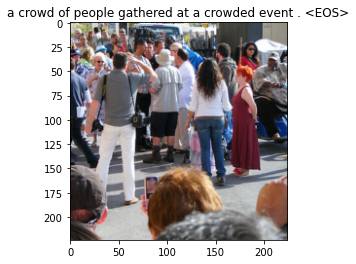

Epoch: 80 loss: 1.47223


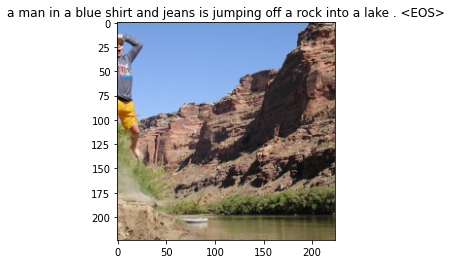

Epoch: 81 loss: 1.35224


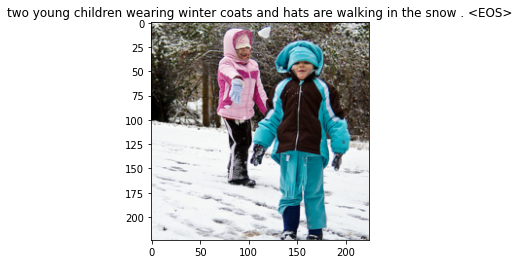

Epoch: 82 loss: 1.40355


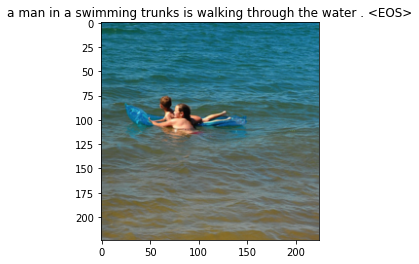

Epoch: 83 loss: 1.39817


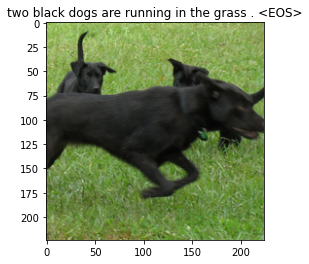

Epoch: 84 loss: 1.36482


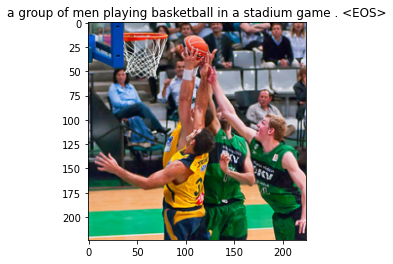

Epoch: 85 loss: 1.41225


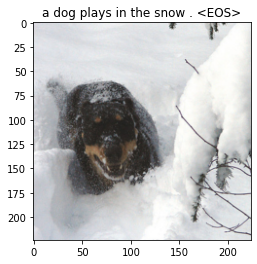

Epoch: 86 loss: 1.39156


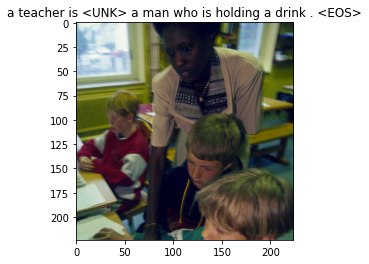

Epoch: 87 loss: 1.37343


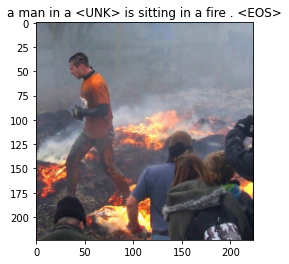

In [ ]:
num_epochs = 100
print_every = 100
losses=[]
for epoch in range(1,num_epochs+1):
    losses_per_epoch=0
    for idx, (image, captions) in enumerate(iter(train_loader)):
        image,captions = image.to(device),captions.to(device)
        optimizer.zero_grad()
        outputs,attentions = model(image, captions)
        targets = captions[:,1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))
        losses_per_epoch+=loss.item()
        loss.backward()

        # Update the parameters in the optimizer.
        optimizer.step()

        if (idx+1)%print_every == 0:
            print("Epoch: {} loss: {:.5f}".format(epoch,loss.item()))
            
            
            #generate the caption
            model.eval()
            with torch.no_grad():
                dataiter = iter(validation_loader)
                img,_ = next(dataiter)
                features = model.encoder(img[0:1].to(device))
                caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
                caption = ' '.join(caps)
                show_image(img[0],title=caption)
                
            model.train()
    losses.append(losses_per_epoch)
    #save the latest model
    save_model(model,epoch)

In [ ]:
 !ls

In [ ]:
from IPython.display import FileLink
FileLink("attention_model_state.pth")

In [ ]:
#testing
import nltk
from nltk.translate.bleu_score import sentence_bleu
model.eval()
img,caption=next(iter(validation_loader))
img_=img[50]
print(img.size())
show_image(img_," ".join([dataset.vocab.itos[k] for k in caption[50].tolist() if dataset.vocab.itos[k]!="<PAD>"]))
features = model.encoder(img_.unsqueeze(0).to(device))
caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
caption_ = ' '.join(caps)
reference=[[dataset.vocab.itos[k] for k in caption[50].tolist() if dataset.vocab.itos[k]!="<PAD>"]]
candidate=caps
print(reference,candidate)
score=sentence_bleu(reference,candidate,weights=(1,0,0,0))
print("Generated caption : ",caption_)
print("Bleu 1 gram score : ",score)

In [ ]:
#checking corpus bleu score
from nltk.translate.bleu_score import corpus_bleu
references=[]
candidates=[]
for idx,(image,caption) in enumerate(iter(validation_loader)):
    print(image.size())
    for k in range(image.size()[0]):
        features=model.encoder(image[k].unsqueeze(0).to(device))
        caps,alpha=model.decoder.generate_caption(features,vocab=dataset.vocab)
        reference=[dataset.vocab.itos[i] for i in caption[k].tolist() if dataset.vocab.itos[i]!="<PAD>"]
        references.append(reference)
        candidates.append(caps)


In [ ]:
print("bleu 1 score : ",corpus_bleu(references,candidates,weights=(1,0,0,0)))
print("bleu 2 score : ",corpus_bleu(references,candidates,weights=(0.5,0.5,0,0)))
print("bleu 3 score : ",corpus_bleu(references,candidates,weights=(0.33,0.33,0.33,0)))
print("bleu 4 score : ",corpus_bleu(references,candidates,weights=(0.25,0.25,0.25,0.25)))

In [ ]:
def attention_plot(image,caps,alphas):
    image=image.numpy().transpose((1,2,0))
    len_result=len(caps)
    temp_image=image
    fig=plt.figure(figsize=(15,15))
    for k in range(len_result):
        temp_att=alphas[k].reshape(7,7)
        ax=fig.add_subplot(len_result//2,len_result//2,k+1)
        ax.set_title(caps[k])
        img=ax.imshow(temp_image)
        ax.imshow(temp_att,cmap="gray",alpha=0.7,extent=img.get_extent())
    plt.tight_layout()
    plt.show()

In [ ]:
dataiter=iter(validation_loader)
images,_=next(dataiter)
img1=images[0].detach().clone()
features=model.encoder(img1.unsqueeze(0).to(device))
caps,alphas=model.decoder.generate_caption(features,vocab=dataset.vocab)
attention_plot(img1,caps,alphas)